# spectral unmixing using non-negative matrix factorisation

In [3]:
!pip install scipy scikit-learn matplotlib  
# for mat files, ml-nmf, ploting. 

In [19]:
import scipy.io
import numpy as np

data=scipy.io.loadmat("Indian_pines_corrected.mat")["indian_pines_corrected"]

print("Data shape:",data.shape)
print("ground truth shape:",gt.shape)


Data shape: (145, 145, 200)
ground truth shape: (145, 145)


In [22]:
h,w,bands=data.shape
x=data.reshape(-1,bands)
print("new shape 2d:\n",x)
# normalise minmax
x=x/np.max(x)
print("normalised x:\n",x)



new shape 2d:
 [[3172 4142 4506 ... 1057 1020 1020]
 [2580 4266 4502 ... 1064 1029 1020]
 [3687 4266 4421 ... 1061 1030 1016]
 ...
 [3153 3864 4282 ... 1003 1008 1000]
 [3155 4104 4106 ... 1011 1005 1003]
 [3323 3860 4197 ... 1007 1004 1000]]
normalised x:
 [[0.33027905 0.43127863 0.46917951 ... 0.11005831 0.10620575 0.10620575]
 [0.26863807 0.44418992 0.46876302 ... 0.11078717 0.10714286 0.10620575]
 [0.38390254 0.44418992 0.46032903 ... 0.1104748  0.10724698 0.10578925]
 ...
 [0.32830071 0.40233236 0.44585589 ... 0.10443565 0.10495627 0.10412328]
 [0.32850895 0.42732195 0.4275302  ... 0.10526864 0.1046439  0.10443565]
 [0.34600167 0.40191587 0.43700541 ... 0.10485214 0.10453978 0.10412328]]


In [40]:
#applying non-negetive matrix factorisation

from sklearn.decomposition import NMF
n_endmembers=16
nmf=NMF(n_components=n_endmembers, init='random', random_state=0, max_iter=1000)
W=nmf.fit_transform(x)
H=nmf.components_

print("W (abundance):",W.shape)
print("H (endmembers):",H.shape)

W (abundance): (21025, 16)
H (endmembers): (16, 200)


C:\Users\dines\anaconda3\Lib\site-packages\sklearn\decomposition\_nmf.py:1770: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.
  warnings.warn(


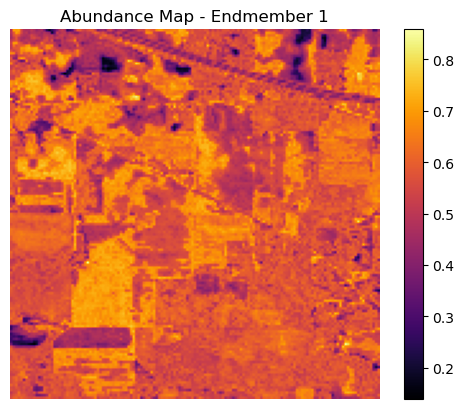

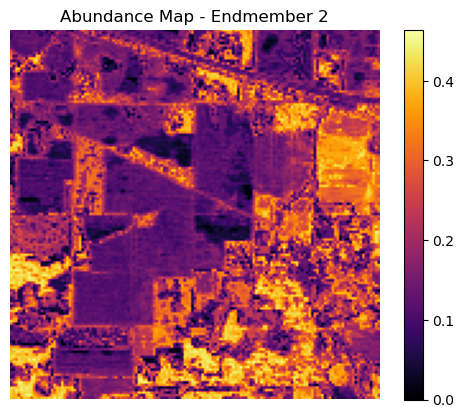

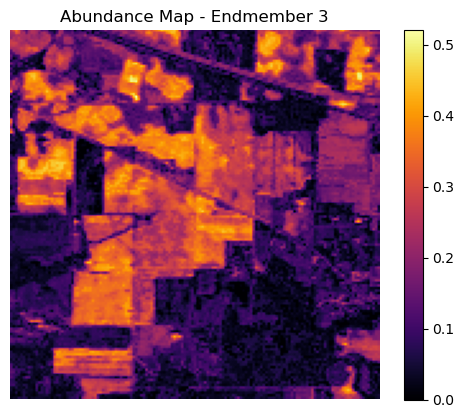

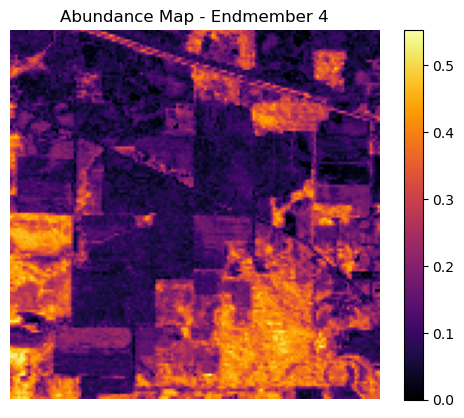

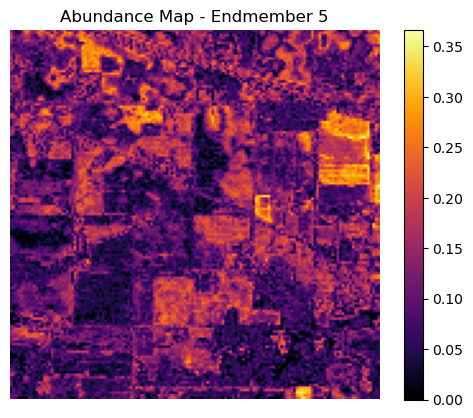

...

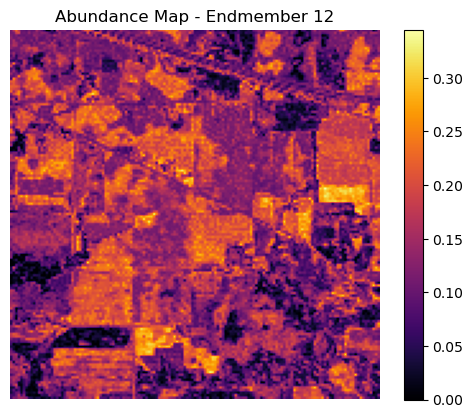

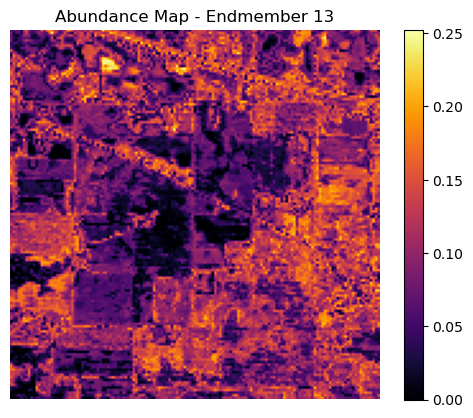

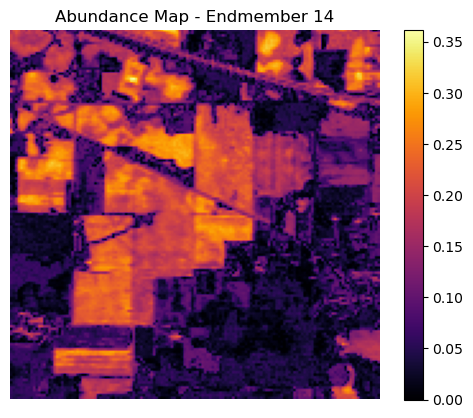

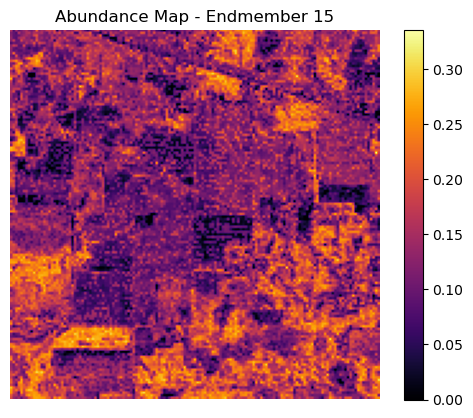

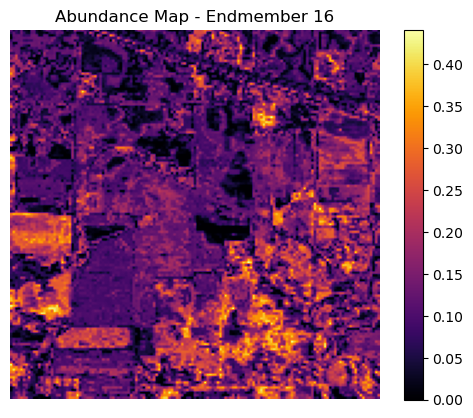

In [41]:
import matplotlib.pyplot as plt

# Reshape back to image size
for i in range(n_endmembers):
    abundance_map = W[:, i].reshape(h, w)
    plt.imshow(abundance_map, cmap='inferno')
    plt.title(f"Abundance Map - Endmember {i+1}")
    plt.axis('off')
    plt.colorbar()
    plt.show()


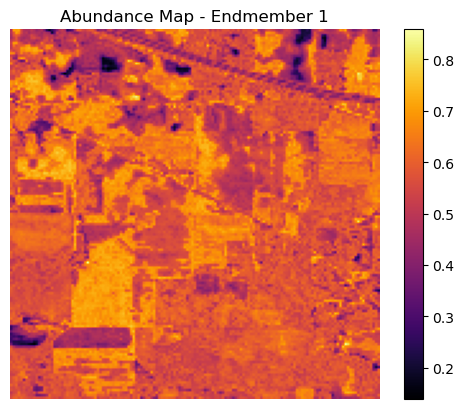

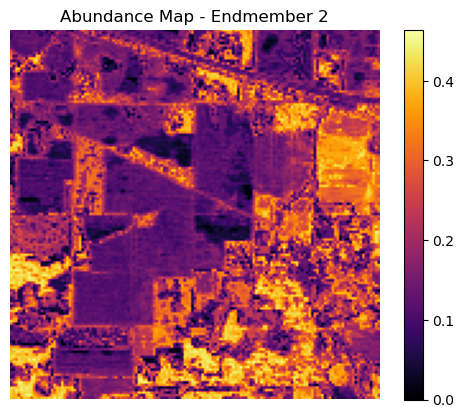

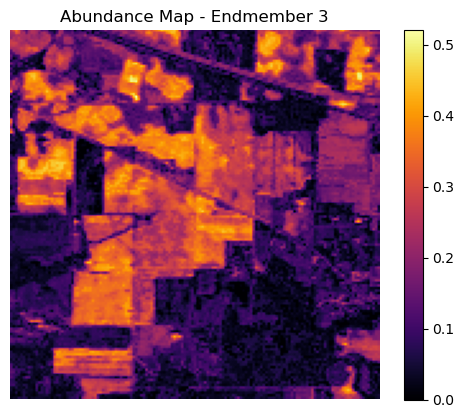

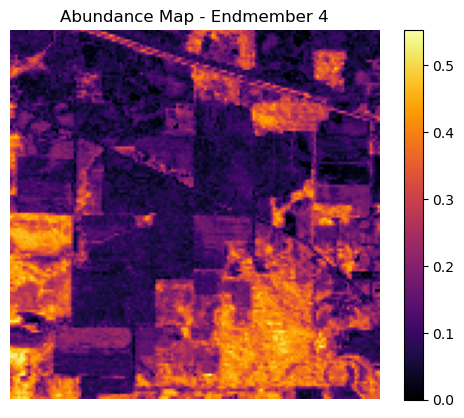

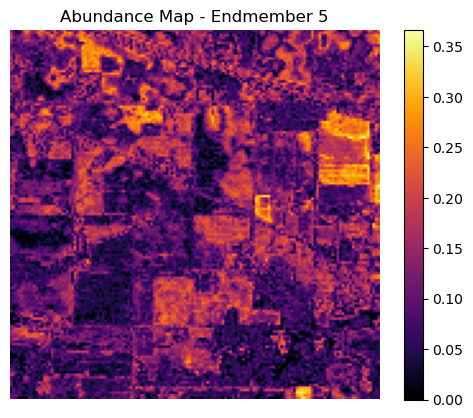

...

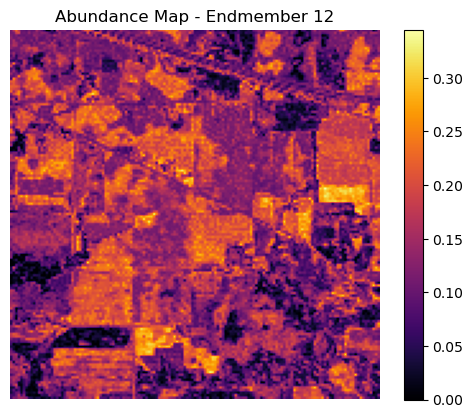

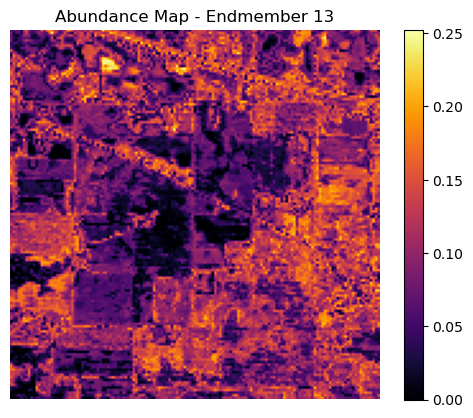

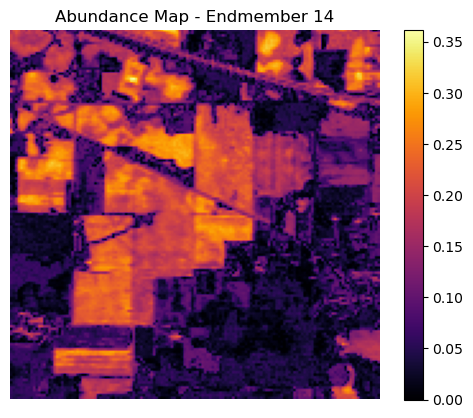

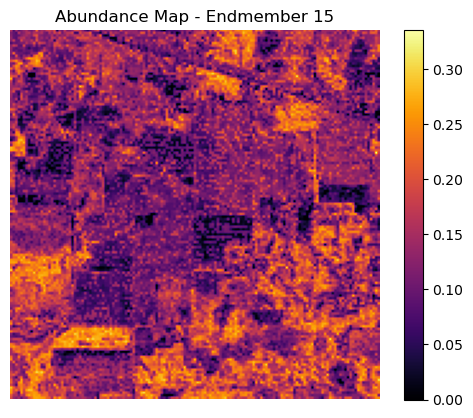

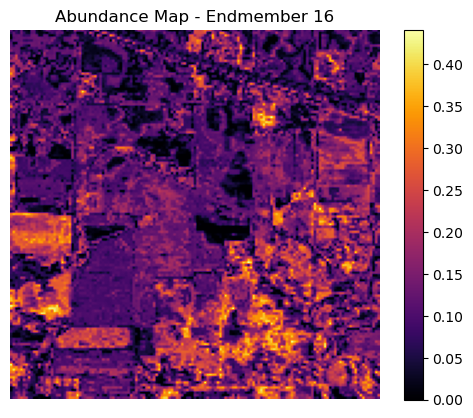

In [42]:
import matplotlib.pyplot as plt

# Assuming: W = abundance matrix, shape (145*145, 10)
h, w = 145, 145  # image shape

for i in range(W.shape[1]):
    abundance_map = W[:, i].reshape(h, w)
    plt.imshow(abundance_map, cmap='inferno')
    plt.title(f"Abundance Map - Endmember {i+1}")
    plt.axis('off')
    plt.colorbar()
    plt.show()


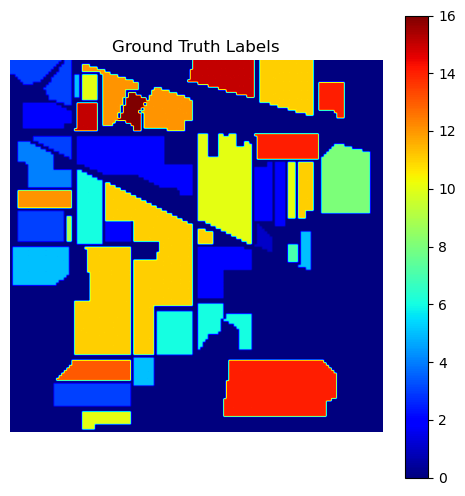

In [43]:
plt.figure(figsize=(6, 6))
plt.imshow(gt, cmap='jet')
plt.title("Ground Truth Labels")
plt.axis('off')
plt.colorbar()
plt.show()


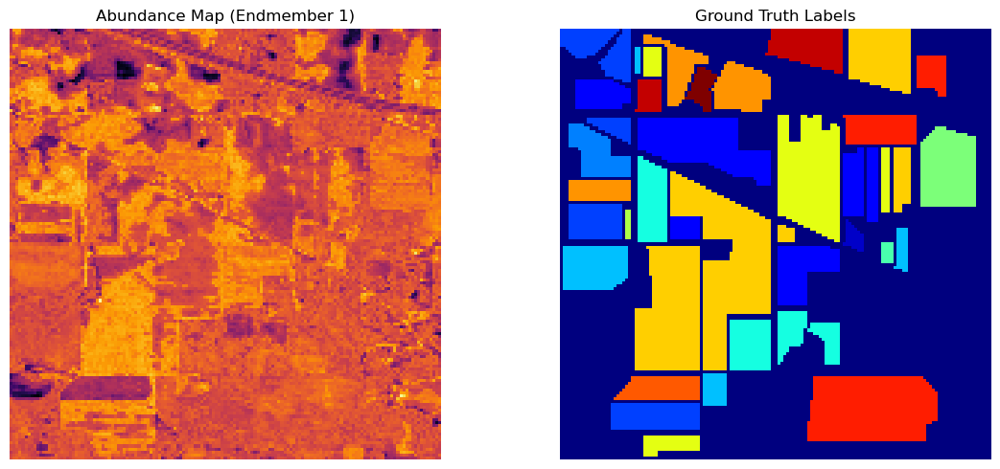

In [44]:
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

axs[0].imshow(W[:, 0].reshape(h, w), cmap='inferno')
axs[0].set_title("Abundance Map (Endmember 1)")
axs[0].axis('off')

axs[1].imshow(gt, cmap='jet')
axs[1].set_title("Ground Truth Labels")
axs[1].axis('off')

plt.tight_layout()
plt.show()


In [45]:
label_names = {
    1: 'Alfalfa',
    2: 'Corn-notill',
    3: 'Corn-mintill',
    4: 'Corn',
    5: 'Grass-pasture',
    6: 'Grass-trees',
    7: 'Grass-pasture-mowed',
    8: 'Hay-windrowed',
    9: 'Oats',
    10: 'Soybean-notill',
    11: 'Soybean-mintill',
    12: 'Soybean-clean',
    13: 'Wheat',
    14: 'Woods',
    15: 'Buildings-Grass-Trees',
    16: 'Stone-Steel-Towers'
}


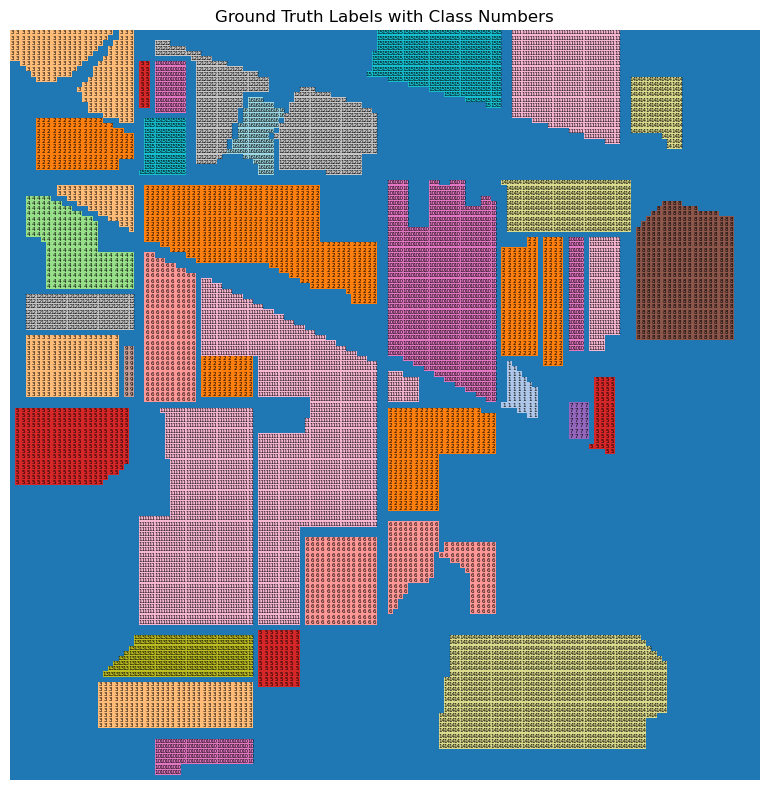

In [46]:
import matplotlib.pyplot as plt
import numpy as np

# gt = your ground truth label matrix (shape: [145, 145])
h, w = gt.shape

plt.figure(figsize=(8, 8))
plt.imshow(gt, cmap='tab20')  # color each label class

# Add label numbers where they appear
for i in range(h):
    for j in range(w):
        label = gt[i, j]
        if label != 0:  # ignore background (label 0)
            plt.text(j, i, str(label), fontsize=4
                     , ha='center', va='center', color='black')

plt.title("Ground Truth Labels with Class Numbers")
plt.axis('off')
plt.tight_layout()
plt.show()


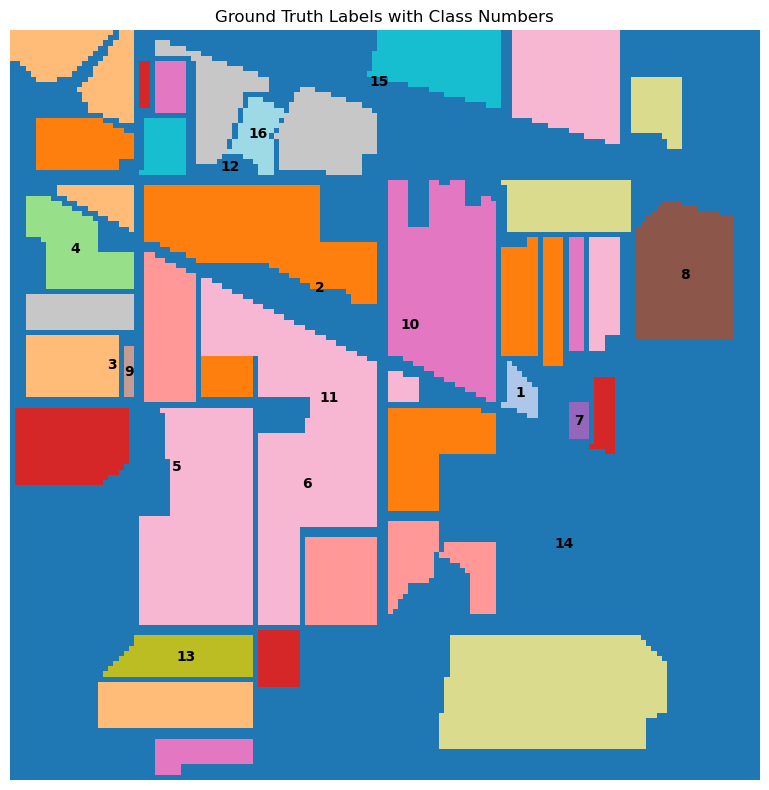

In [47]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.ndimage import center_of_mass

# Load your ground truth (assume it's stored in variable `gt`)
h, w = gt.shape

plt.figure(figsize=(8, 8))
plt.imshow(gt, cmap='tab20')
plt.title("Ground Truth Labels with Class Numbers")
plt.axis('off')

# Loop over all label values
labels = np.unique(gt)
for label in labels:
    if label == 0:
        continue  # skip background

    # Create a binary mask for the current label
    mask = (gt == label)

    # Compute center of mass
    cy, cx = center_of_mass(mask)
    
    # Plot label number at the center
    plt.text(cx, cy, str(label), color='black', fontsize=10, ha='center', va='center', weight='bold')

plt.tight_layout()
plt.show()


# spectral unmixing using endnet

In [48]:
python train.py --dataset indian_pines --epochs 300 --endmembers 16


SyntaxError: invalid syntax (3695432899.py, line 1)